In [60]:
import os
import random

import openslide
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import time

Whole slide images are at 20x magnification and can be quite large. The TMAs are smaller (roughly 4,000x4,000 pixels) but at 40x magnification. 

Hence for lower resolution...

In [2]:
# set parameters
DATA_DIR = 'Data/'
MODE = "DEV"
EXT = '.tif'
PATCH_SIZE = 256
STRIDE = 128
MIN_TISSUE_RATIO = 0.5

# calculate
IMAGE_DIR = os.path.join(DATA_DIR, 'train_images')
PATCH_AREA = PATCH_SIZE * PATCH_SIZE
NUM_PATCH_PIXELS = PATCH_AREA*3

In [5]:
tif_imgs = list(filter(lambda img: img.endswith(EXT), os.listdir(IMAGE_DIR)))
len(tif_imgs)

538

In [9]:
train_labels = pd.read_csv(os.path.join(DATA_DIR, 'train_hot.csv'), index_col=0)
train_labels

,image_id,label,image_width,image_height,is_tma,label_cat,is_tma_hot
0,4,HGSC,23785,20008,False,5,0
1,66,LGSC,48871,48195,False,2,0
2,91,HGSC,3388,3388,True,5,1
3,281,LGSC,42309,15545,False,2,0
4,286,EC,37204,30020,False,3,0
...,...,...,...,...,...,...,...
533,65022,LGSC,53355,46675,False,2,0
534,65094,MC,55042,45080,False,1,0
535,65300,HGSC,75860,27503,False,5,0
536,65371,HGSC,42551,41800,False,5,0


#### WSI example - 20X

In [10]:
random.sample(tif_imgs, k=1)

['1080.tif']

In [11]:
image_id = 1080

In [12]:
train_labels[train_labels.image_id==image_id]

,image_id,label,image_width,image_height,is_tma,label_cat,is_tma_hot
9,1080,HGSC,31336,23200,False,5,0


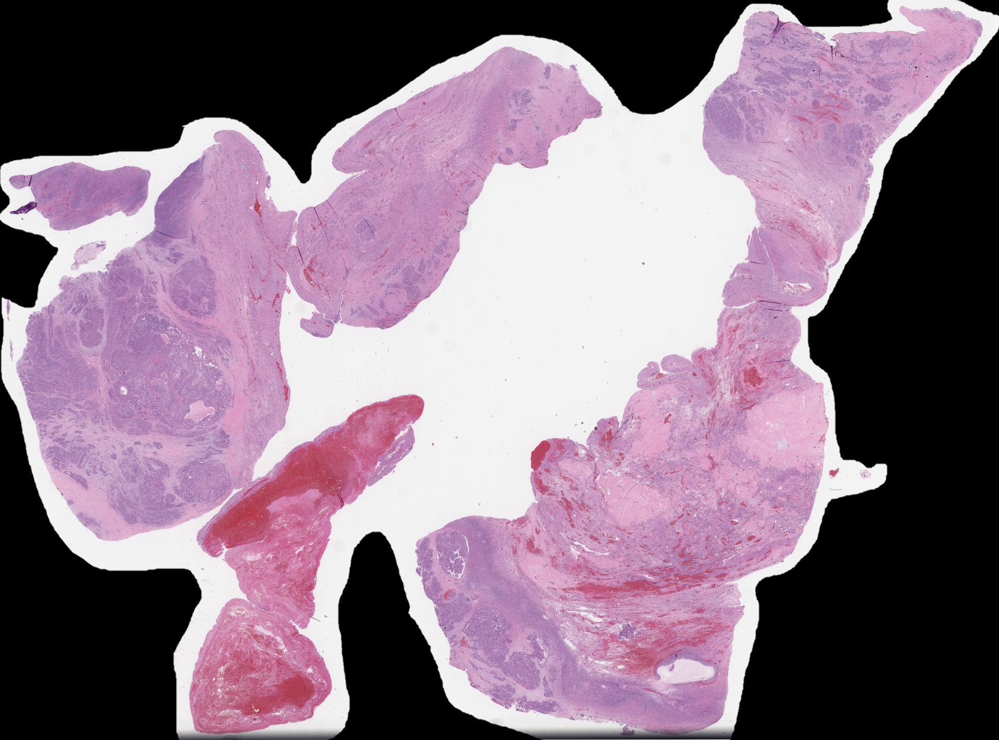

In [13]:
wsi = openslide.OpenSlide(os.path.join(IMAGE_DIR, f"{image_id}.tif"))
wsi.get_thumbnail(wsi.level_dimensions[-4])

In [14]:
print(wsi.level_count)
print(wsi.level_dimensions)
print(wsi.level_downsamples)

8
((31336, 23200), (15668, 11600), (7834, 5800), (3917, 2900), (1958, 1450), (979, 725), (489, 362), (244, 181))
(1.0, 2.0, 4.0, 8.0, 16.002042900919307, 32.00408580183861, 64.08509869052864, 128.3015125441536)


### TMA example - 40X

In [18]:
random.sample(list(train_labels[train_labels.is_tma==True].image_id.values), k=1)

[57696]

In [19]:
image_id = 57696

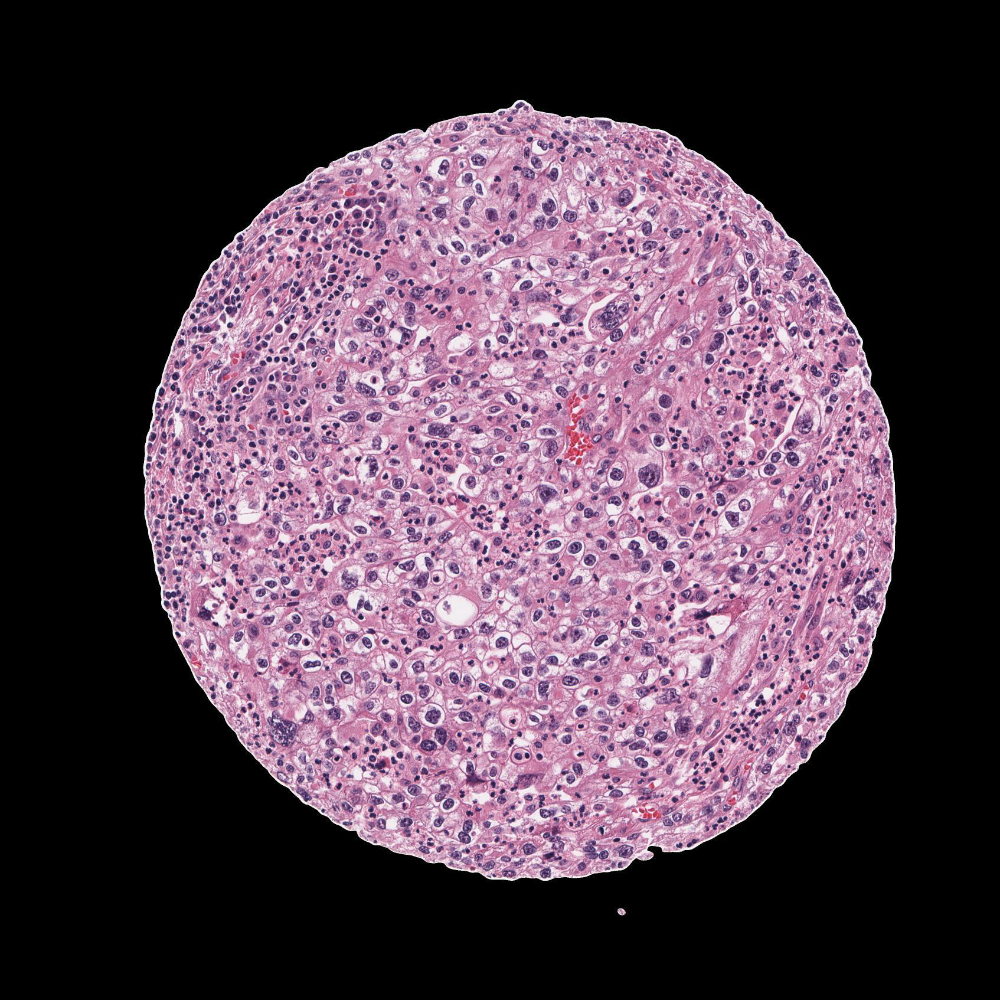

In [20]:
wsi = openslide.OpenSlide(os.path.join(IMAGE_DIR, f"{image_id}.tif"))
wsi.get_thumbnail(wsi.level_dimensions[-4])

In [21]:
print(wsi.level_count)
print(wsi.level_dimensions)
print(wsi.level_downsamples)

5
((3388, 3388), (1694, 1694), (847, 847), (423, 423), (211, 211))
(1.0, 2.0, 4.0, 8.009456264775414, 16.05687203791469)


To compare, have to make both 20X, means reading WSIs at level 0 and TMAs at level 1. But this means losing information from TMAs, which are most prominent in the test set.

### If TMA, sample at level 1.

In [23]:
image_ids = list(map(lambda img: img[:-4], tif_imgs))

In [24]:
def is_tma_image(image_id, label_df=train_labels):
    return label_df[label_df.image_id==image_id].is_tma.item()

Both at 20X - read level 1 if tma

Still sample at 20X

In [26]:
background_cutoff = 220

patch_df = pd.DataFrame(columns=['image_id', 'x_coord', 'y_coord'])

for image_id in image_ids:
    start = time.time()
    
    wsi = openslide.OpenSlide(os.path.join(IMAGE_DIR, f"{image_id}.tif"))
    level = 1 if is_tma_image(image_id) else 0
    wsi_size = wsi.level_dimensions[level]
    
    slide_patch_df = pd.DataFrame(columns=['image_id', 'x_coord', 'y_coord'])

    for x in range(0, wsi_size[0], STRIDE):
        for y in range(0, wsi_size[1], STRIDE):
            # load tile
            tile = wsi.read_region((x, y), level=level, size=(PATCH_SIZE, PATCH_SIZE))
            tile_arr = np.array(tile)[..., :3]
            
            nz = np.nonzero(tile_arr)
            if NUM_PATCH_PIXELS - len(nz[0]) + \
                np.sum(tile_arr[nz] > background_cutoff) <= MIN_TISSUE_RATIO*NUM_PATCH_PIXELS:
                # add to patch_df
                slide_patch_df = pd.concat([slide_patch_df, pd.DataFrame.from_dict({'image_id': image_id, 
                                                                'x_coord': [x], 'y_coord':[y]})],
                                      ignore_index=True)
    
    
    patch_df = pd.concat([patch_df, slide_patch_df], ignore_index=True)
    
    end = time.time()
    print(f'Found {len(slide_patch_df)} patches for image {image_id} in {(end-start):.0f} seconds')


True

Above is same as existing patch_df from Notebook 5 but just different for TMAs. So just redo TMAs.

In [38]:
patch_df = pd.read_csv('train_patches.csv', index_col=0)
patch_df.tail()

,image_id,x_coord,y_coord
20021307,38687,60928,7424
20021308,38687,60928,7552
20021309,38687,60928,7808
20021310,38687,61056,7296
20021311,38687,61056,7424


First make new df of patches from just WSIs

In [58]:
wsi_ids = train_labels[train_labels.is_tma==False].image_id.values

In [49]:
patch_df_20x = patch_df[patch_df.image_id.isin(wsi_ids)].reset_index(drop=True)

TMA patches are only 7800/20021312 (0.03%!)

Regenerate TMA patches

In [57]:
tma_ids = train_labels[train_labels.is_tma==True].image_id.values
tma_ids

array([   91,  4134,  8280,  9200, 13568, 17637, 21020, 29084, 31594,
       35565, 36302, 36583, 36783, 37385, 40864, 41368, 41586, 42857,
       44603, 47035, 48734, 50932, 53655, 57696, 61797])

Found 93 patches for image 91 in 1 seconds


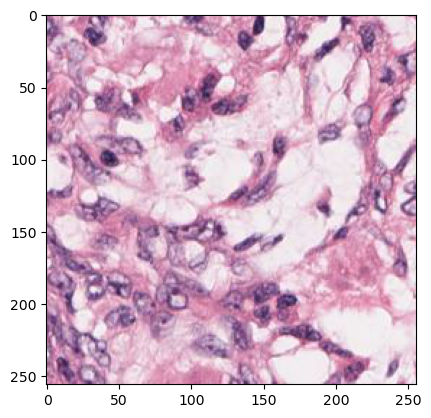

Found 104 patches for image 4134 in 1 seconds


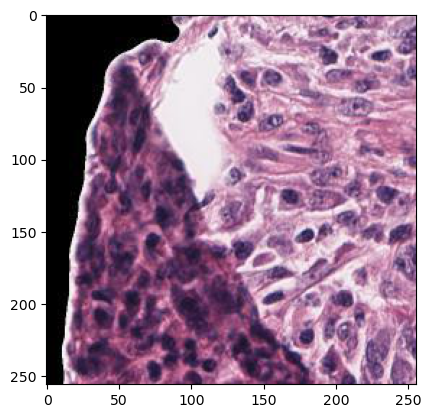

Found 97 patches for image 8280 in 1 seconds
Found 117 patches for image 9200 in 1 seconds


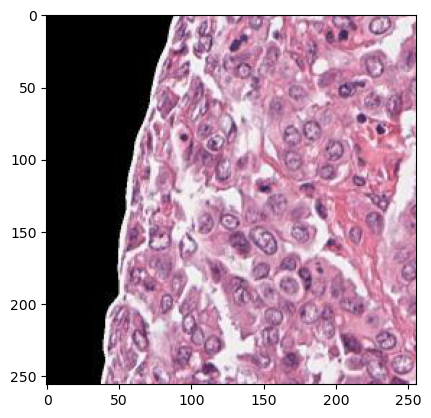

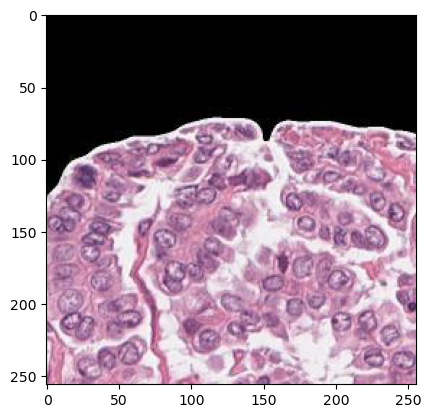

Found 112 patches for image 13568 in 1 seconds


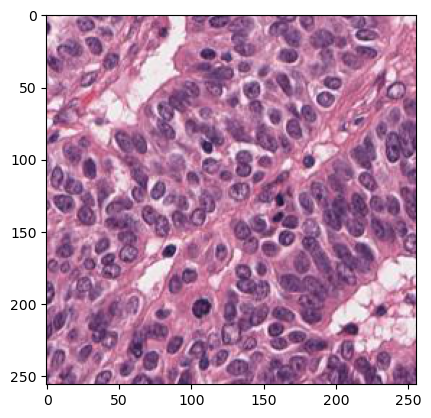

Found 120 patches for image 17637 in 1 seconds


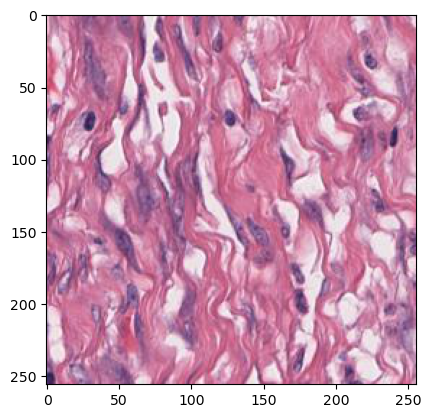

Found 130 patches for image 21020 in 1 seconds


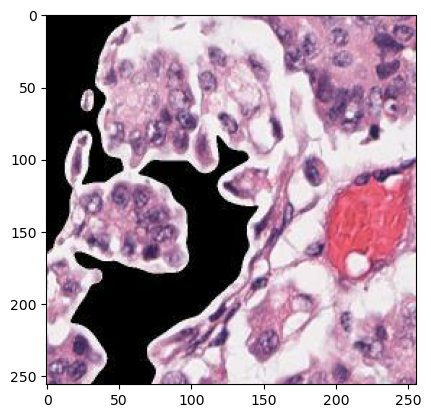

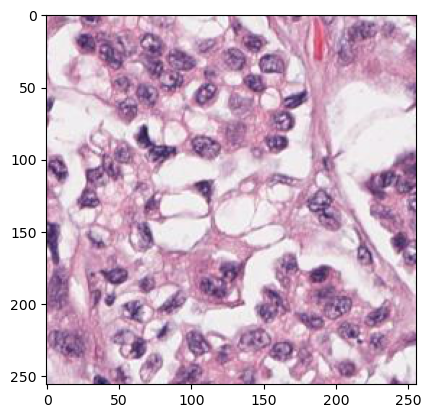

Found 134 patches for image 29084 in 1 seconds


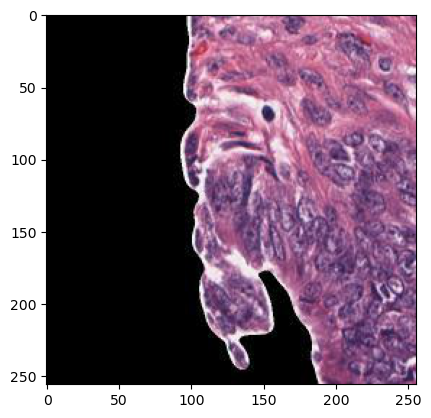

Found 109 patches for image 31594 in 1 seconds


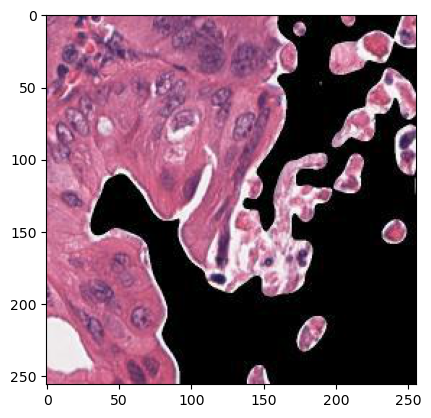

Found 99 patches for image 35565 in 1 seconds


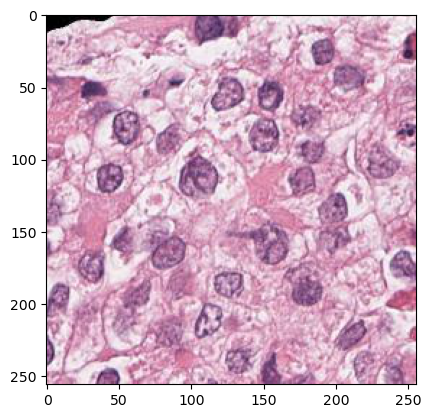

Found 174 patches for image 36302 in 1 seconds


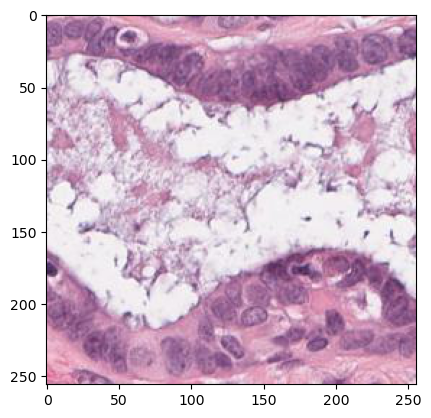

Found 146 patches for image 36583 in 1 seconds
Found 53 patches for image 36783 in 1 seconds


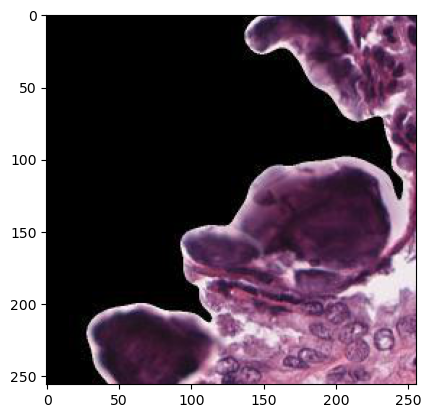

Found 55 patches for image 37385 in 1 seconds


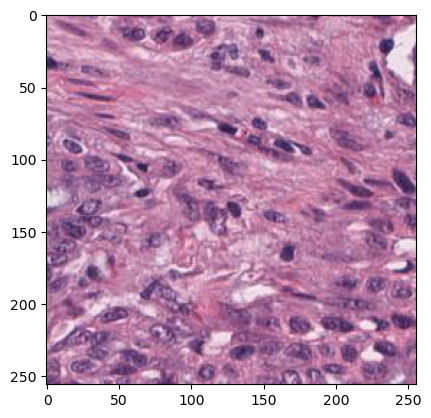

Found 131 patches for image 40864 in 1 seconds


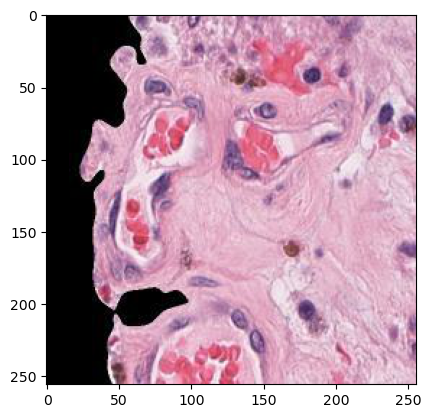

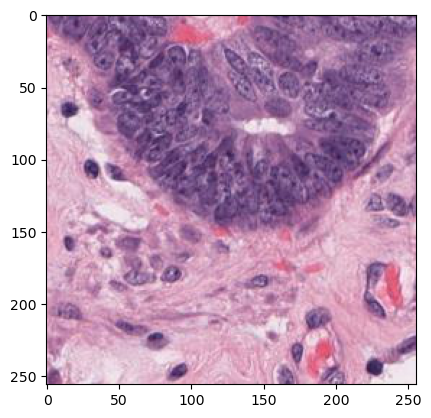

Found 163 patches for image 41368 in 1 seconds


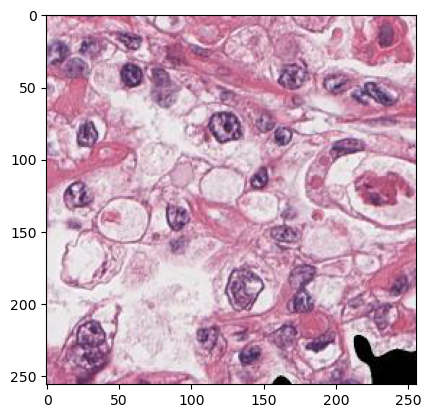

Found 101 patches for image 41586 in 1 seconds


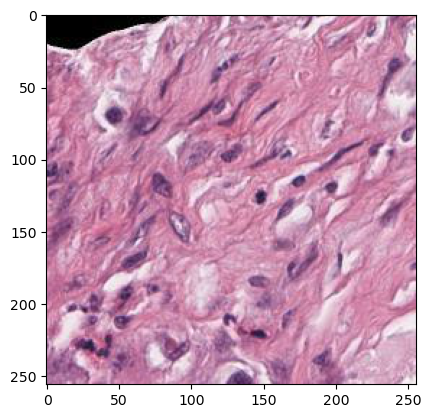

Found 138 patches for image 42857 in 1 seconds


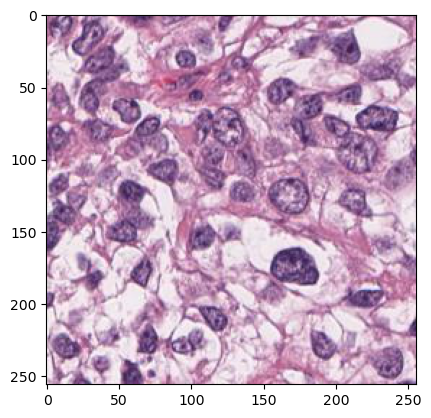

Found 150 patches for image 44603 in 1 seconds


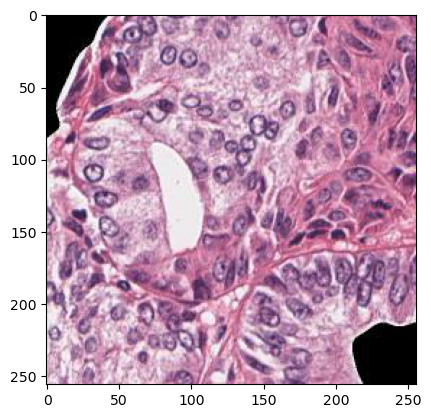

Found 90 patches for image 47035 in 1 seconds
Found 129 patches for image 48734 in 1 seconds


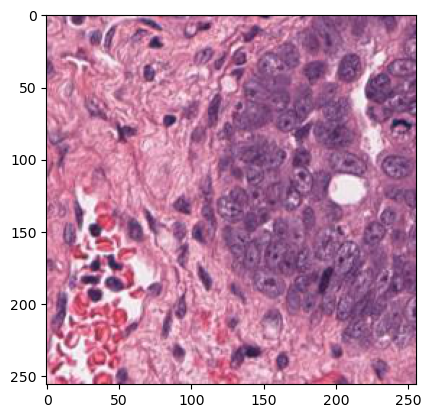

Found 121 patches for image 50932 in 1 seconds


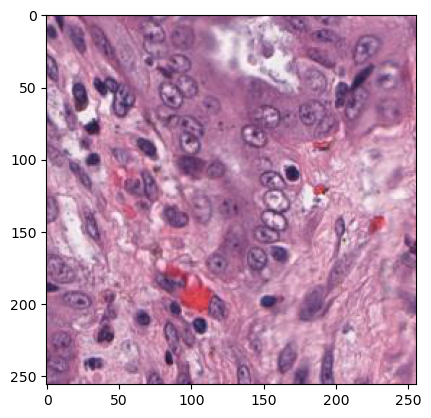

Found 117 patches for image 53655 in 1 seconds


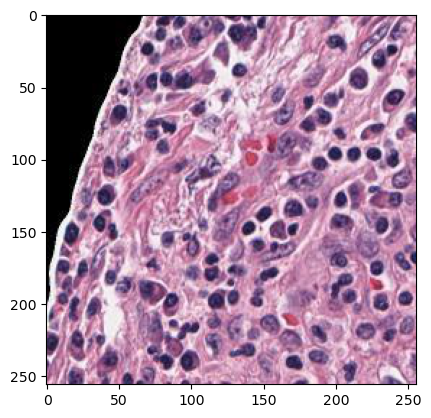

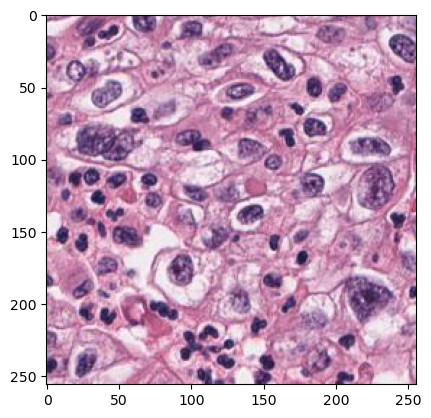

Found 117 patches for image 57696 in 1 seconds


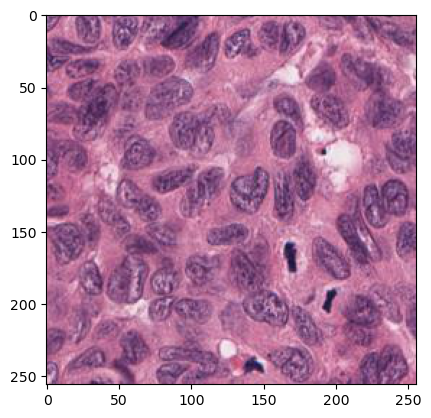

Found 157 patches for image 61797 in 1 seconds


In [64]:
background_cutoff = 220
plot_count = 0

tma_df = pd.DataFrame(columns=['image_id', 'x_coord', 'y_coord'])

for image_id in tma_ids:
    start = time.time()
    
    wsi = openslide.OpenSlide(os.path.join(IMAGE_DIR, f"{image_id}.tif"))
    level = 1 if is_tma_image(image_id) else 0
    wsi_size = wsi.level_dimensions[level]
    
    slide_patch_df = pd.DataFrame(columns=['image_id', 'x_coord', 'y_coord'])

    for x in range(0, wsi_size[0], STRIDE):
        for y in range(0, wsi_size[1], STRIDE):
            # load tile
            tile = wsi.read_region((x, y), level=level, size=(PATCH_SIZE, PATCH_SIZE))
            tile_arr = np.array(tile)[..., :3]
            
            
            nz = np.nonzero(tile_arr)
            if NUM_PATCH_PIXELS - len(nz[0]) + \
                np.sum(tile_arr[nz] > background_cutoff) <= MIN_TISSUE_RATIO*NUM_PATCH_PIXELS:
                # add to patch_df
                slide_patch_df = pd.concat([slide_patch_df, pd.DataFrame.from_dict({'image_id': image_id, 
                                                                'x_coord': [x], 'y_coord':[y]})],
                                      ignore_index=True)
                if plot_count % 100 == 0:
                    plt.imshow(tile_arr)
                    plt.show()
            plot_count += 1
    
    
    tma_df = pd.concat([tma_df, slide_patch_df], ignore_index=True)
    
    end = time.time()
    print(f'Found {len(slide_patch_df)} patches for image {image_id} in {(end-start):.0f} seconds')


In [65]:
len(tma_df)

2957

Using TMAs at 20X magnfication has reduced number of patches from 7800 to 2957

In [68]:
patch_df_20x = pd.concat([patch_df_20x, tma_df], ignore_index=True)

In [72]:
patch_df_20x.to_csv('train_patches_20x.csv')